<a href="https://colab.research.google.com/github/diegogr98/Diego-Gutierrez-Astronomy/blob/main/Copy_of_Taller1_MCON.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Autor:** Diego Gutierrez

**Objetivo:**
1. Simular el comportamiento de un gas, verificando las relaciones que existen entre sus propiedades microscópicas y macroscópicas.

2. Estudiar cómo varían los perfiles de densidad y masa de un cuerpo celeste autogravitante dependiendo del índice politrópico n, resolviendo numéricamente la ecuación de Lane-Emden. A partir de los resultados, se debe estimar el tipo de cuerpo astrofísico representado.


# Comportamiento de un gas

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from scipy.integrate import odeint,solve_ivp,quad
import sympy as sp
from scipy.interpolate import interp1d

## a)Definir un sistema apropiado de unidades termodinámicas tal que $k_B = 1 $.  Esto se logra fijando tres unidades básicas (por ejemplo: longitud, masa y energía), y deduciendo la unidad restante. Se debe justificar cuidadosamente la elección de las unidades.

### Solución

Para establecer un sistema de unidades donde la constante de Boltzmann sea adimensional e igual a uno, es necesario construir un sistema coherente de unidades naturales. Esto se consigue fijando tres magnitudes físicas fundamentales, y determinando la cuarta a partir de la relación dimensional de $ k_B $.

La constante de Boltzmann tiene dimensiones de:

$$
[k_B] = \frac{\text{energía}}{\text{temperatura}}
$$

Por lo tanto, al fijar las unidades de energía, masa y longitud, podemos deducir la unidad natural de temperatura de modo que:

$$
k_B = 1 \quad \Rightarrow \quad [T] = [E]
$$

#### Elección de unidades

Supongamos que elegimos:

- Unidad de longitud: $ [L] = \ell_0 $
- Unidad de masa: $ [M] = m_0 $
- Unidad de energía: $ [E] = \varepsilon_0 $

Entonces, para que $ k_B = 1 $, definimos la unidad de temperatura como:

$$
[T] = \varepsilon_0
$$


## b) Generar posiciones aleatorias para $ N $ partículas de un gas dentro de una caja cúbica de lado $ L = 10 $ (en unidades termodinámicas).  Se recomienda comenzar con un número pequeño de partículas, por ejemplo $ N = 100 $, e incrementar progresivamente dicho valor con el fin de mejorar la precisión de los resultados obtenidos.

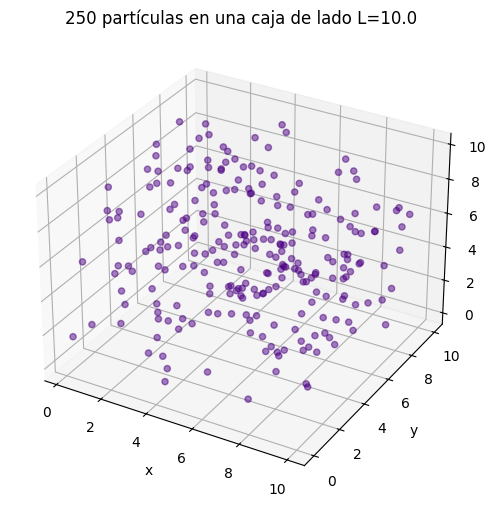

In [2]:
# Parámetros
N = 250              # Número de partículas
L = 10.0              # Lado de la caja en unidades naturales

# Generar posiciones aleatorias dentro de la caja
positions = np.random.uniform(0, L, size=(N, 3))

# Visualización de la caja
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2],
           alpha=0.5, color='indigo')

# Ajustes de la caja
ax.set_title(f'{N} partículas en una caja de lado L={L}')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

plt.show()

## c) Escoger una temperatura inicial $ T $ y una masa $ m_A $ para las partículas.  A partir de estos valores, calcular la velocidad molar $ v_{\text{mol}} $ y la desviación estándar de las velocidades $\sigma_v = \sqrt{\frac{k_B T}{m_A}}.$ Asignar a cada partícula un vector velocidad con componentes generadas aleatoriamente, distribuidas de forma normal (media cero, desviación estándar $ \sigma_v $), de acuerdo con la distribución de Maxwell-Boltzmann. Para generar dichas velocidades se puede utilizar la función `np.random.normal` de NumPy.

## d) Calcular numericamente las siguientes magnitudes en toda la caja:


*  Densidad de número de partículas
*  Densidad de masa
*  Densidad de Energía cinética



In [3]:
# parametros fisicos ( unidades naturales)
T = 1.0             # Temperatura
m_A = 0.5           # Masa de cada partícula
k_B = 1.0           # Constante de Boltzmann

# Desviación estándar de la velocidad para cada dirección
sigma_v = np.sqrt(T / m_A)

# Generar velocidades
velocities = np.random.normal(loc=0.0, scale=sigma_v, size=(N, 3))

# Volumen de la caja
V = L**3

# densidad de numero de particulas
n = N / V

# densidad de masa
m = N * m_A / V

# densidad de energia cinetica
v2 = np.sum(velocities**2, axis=1)     # v^2 para cada partícula
E_k = 0.5 * m_A * np.sum(v2) /V

print(f'Densidad de número de partículas: {n}')
print(f'Densidad de masa: {m}')
print(f'Densidad de energía cinética: {E_k}')

Densidad de número de partículas: 0.25
Densidad de masa: 0.125
Densidad de energía cinética: 0.3803463918691911


## e) Calcular la rapidez  de cada partícula y hacer un histograma de rapideces. Comparar dicho histograma con la funcion de Maxwell-Boltzmann:

$$
f(v) = 4\pi \left( \frac{m}{2\pi T} \right)^{3/2} v^2 \exp\left( -\frac{m v^2}{2T} \right)
$$

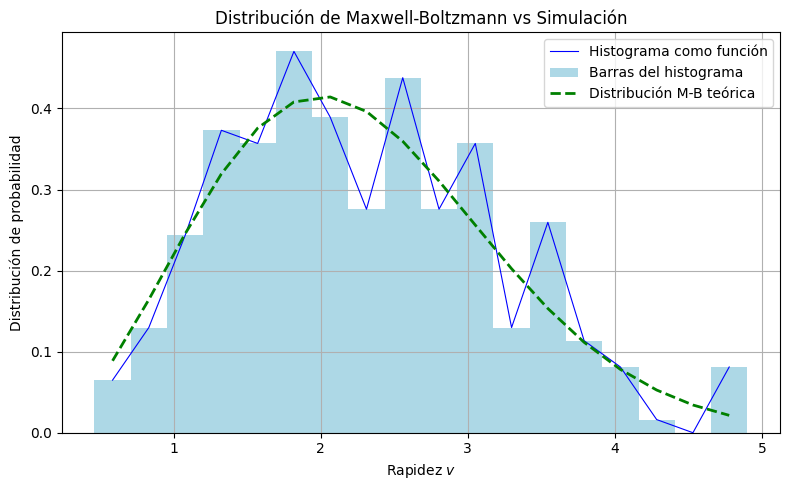

In [4]:
# Rapidez (magnitud del vector)
speeds = np.linalg.norm(velocities, axis=1)

# Histograma
bins = 18
hist, bin_edges = np.histogram(speeds, bins=bins, density=True)
bin_width = bin_edges[1] - bin_edges[0]
bin_centers = bin_edges[:-1] + bin_width/2

# Distribución de Maxwell-Boltzmann (en unidades naturales)
def maxwell_boltzmann(v, T=1.0, m=1.0):
    coef = 4 * np.pi * (m / (2 * np.pi * T))**1.5
    return coef * v**2 * np.exp(-m * v**2 / (2 * T))

# Evaluamos la distribución teórica en los mismos puntos que el histograma
theoretical = maxwell_boltzmann(bin_centers, T, m_A)

# Gráfica comparativa
plt.figure(figsize=(8, 5))
plt.plot(bin_centers, hist, label='Histograma como función',
         lw=0.8, color='blue')
plt.hist(speeds, bins=bins, density=True,
         histtype='stepfilled', label='Barras del histograma',
         color='lightblue')
plt.plot(bin_centers, theoretical, '--',
         label='Distribución M-B teórica',
         lw=2, color='green')
plt.xlabel('Rapidez $v$')
plt.ylabel('Distribución de probabilidad')
plt.title('Distribución de Maxwell-Boltzmann vs Simulación')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## f) Definir un paso de tiempo para simular el movimiento de las partículas. Esto implica:

*   Calcular la longitud libre media $L_{mol}$
*   Establecer el paso de tiempo como $dt=(L_{mol}/v_0) / f_t$, con $f_t=10$ modificable según rendimiento




In [5]:
# Diámetro efectivo de la molécula (en unidades naturales)
d = 0.8

# Longitud libre media según teoría cinética
L_mol = 1 / (np.sqrt(2) * np.pi * d**2 * n)

# Velocidad cuadrática media
v_rms = np.sqrt(np.mean(v2))

# Paso de tiempo con factor de seguridad
f_t = 15
dt = (L_mol / v_rms) / f_t

print(f'Longitud libre media L_mol: {L_mol}')
print(f'Velocidad media cuadrática v_rms: {v_rms}')
print(f'Paso de tiempo dt: {dt}')

Longitud libre media L_mol: 1.406744243995478
Velocidad media cuadrática v_rms: 2.4668891888179854
Paso de tiempo dt: 0.03801668515343196


## g)Simular el movimiento de las partículas de gas:


*   Actualizar posiciones en cada paso de tiempo según velocidades
*   Implementar condiciones de frontera mediante reflexión al chocar con las paredes
*   Detectar colisiones entre partículas cercanas (separación menor que $f_d L_{mol}$ con $f_d = 10$) y aplicar la rutina de colisión elástica



In [6]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
# Función de colisión elástica
def colision(r1, r2, v1, v2):
    r = r1 - r2
    n = r / np.linalg.norm(r)
    vrel = v1 - v2
    vn = np.dot(vrel, n) * n
    v1f = v1 - vn
    v2f = v2 + vn
    return v1f, v2f


# Simulación
cambio_momentum = np.zeros(3)
steps = 100
def actualizar():
    global positions, velocities, cambio_momentum
    # Actualizar posiciones
    positions += velocities * dt

    # Reflexión en paredes
    for i in range(3):
        mask_low = positions[:, i] < 0
        mask_high = positions[:, i] > L
        velocities[mask_low | mask_high, i] *= -1
        positions[:, i] = np.clip(positions[:, i], 0, L)

        # Cambio de momento (2 * m * v) por partícula reflejada
        delta_p_low = np.sum(2 * m_A * velocities[mask_low, i])
        delta_p_high = np.sum(2 * m_A * velocities[mask_high, i])
        cambio_momentum[i] += np.abs(delta_p_low) + np.abs(delta_p_high)

    # Colisiones
    for i in range(N):
        for j in range(i + 1, N):
            dist = np.linalg.norm(positions[i] - positions[j])
            if dist < 0.4* L_mol:  # factor fd = 0.5
                velocities[i], velocities[j] = colision(
                    positions[i], positions[j], velocities[i], velocities[j]
                )


# Animación 2D (proyección XY)
fig, ax = plt.subplots(figsize=(6, 6))
sc = ax.scatter(positions[:, 0], positions[:, 1], s=15, color='indigo')
ax.set_xlim(0, L)
ax.set_ylim(0, L)
ax.set_title("Simulación del gas (XY)")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_aspect('equal')

def animate(frame):
    actualizar()
    sc.set_offsets(positions[:, :2])
    return sc,

# Crear animación
ani = FuncAnimation(fig, animate, frames=steps, interval=50, blit=True)

# Cerrar figura para evitar doble salida
plt.close(fig)

# Mostrar solo la animación
HTML(ani.to_jshtml())

##h) Calcular la presión ejercida por el gas sobre las paredes, a partir del cambio de momento lineal por unidad de tiempo. Comparar la presión obtenida con:


*   La densidad de energía cinética.
*   La ecuación de estado del gas ideal.



In [7]:
t_total = steps * dt
area_cara = L**2  # cada cara de la caja
area_total = 6 * area_cara  # caja cúbica

# suma total de momentos intercambiados con las paredes
total_dp = np.sum(cambio_momentum)

# presión estimada
P_sim = total_dp / (t_total * area_total)

# Comparaciones

P_Ek = 2/3 * E_k
P_ideal = n * T

print(f"\nPresión simulada: {P_sim:.4f}")
print(f"Presión por energía cinética (2/3 E_k/V): {P_Ek:.4f}")
print(f"Presión por ecuación de estado ideal (n·T): {P_ideal:.4f}")


Presión simulada: 0.2671
Presión por energía cinética (2/3 E_k/V): 0.2536
Presión por ecuación de estado ideal (n·T): 0.2500


##i) Realizar experimentos adicionales con el modelo:

*   *Expansión libre:* Las partículas se inicializan ocupando únicamente la mitad de la caja. Posteriormente, se elimina la barrera que las confinaba, permitiéndoles expandirse libremente hacia el resto del volumen. Se observa la redistribución espacial del gas y se calculan la densidad y la presión al final del proceso. Estos resultados se comparan con las predicciones teóricas correspondientes a una expansión de Joule




In [8]:
# Inicializar solo en mitad izquierda (x in [0, L/2])
positions = np.random.uniform(low=[0, 0, 0],
                              high=[L/2, L, L], size=(N, 3))
velocities = np.random.normal(loc=0.0, scale=sigma_v, size=(N, 3))

# Volumen y densidad inicial
V_i = (L/2) * L * L
n_i = N / V_i
E_k_i = 0.5 * m_A * np.sum(np.sum(velocities**2, axis=1))
T_i = (2 / (3 * N * k_B)) * E_k_i
P_i = (2/3) * (E_k_i / V_i)

# Simulación
L_mol = 1 / (np.sqrt(2) * np.pi * d**2 * n_i)
v2 = np.sum(velocities**2, axis=1)
v_rms = np.sqrt(np.mean(v2))
dt = (L_mol / v_rms) / f_t

fig, ax = plt.subplots(figsize=(6, 6))
sc = ax.scatter(positions[:, 0], positions[:, 1], s=15, color='indigo')
ax.set_xlim(0, L)
ax.set_ylim(0, L)
ax.set_title("Expansión libre (XY)")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_aspect('equal')

# Actualizar posiciones

def actualizar_expansion():
    global positions, velocities
    positions += velocities * dt

    for i in range(3):
        mask_low = positions[:, i] < 0
        mask_high = positions[:, i] > L
        velocities[mask_low | mask_high, i] *= -1
        positions[:, i] = np.clip(positions[:, i], 0, L)

    # Colisiones entre partículas
    for i in range(N):
        for j in range(i + 1, N):
            dist = np.linalg.norm(positions[i] - positions[j])
            if dist < 0.6 * L_mol:
                velocities[i], velocities[j] = colision(
                    positions[i], positions[j], velocities[i], velocities[j]
                )
    return positions



def animate(frame):
    actualizar_expansion()
    sc.set_offsets(positions[:, :2])
    return sc,

ani1 = FuncAnimation(fig, animate, frames=steps, interval=50, blit=True)
plt.close(fig)

# Mostrar animación
HTML(ani1.to_jshtml())


In [9]:
# Calcular valores finales
V_f = L**3
n_f = N / V_f
E_k_f = 0.5 * m_A * np.sum(np.sum(velocities**2, axis=1))
P_f = (2/3) * (E_k_f / V_f)

# Resultados teóricos expansión de Joule
n_teo = n_i * (V_i / V_f)
P_teo = P_i * (V_i / V_f)

print("\n-- Resultados de la Expansión Libre --")
print(f"Presión inicial: {P_i:.3f}, final: {P_f:.3f}")
print(f"Densidad inicial: {n_i:.3f}, final: {n_f:.3f}")
print("los resultados teóricos son:")
print(f"Presión: {P_teo:.3f}, densidad: {n_teo:.3f}")


-- Resultados de la Expansión Libre --
Presión inicial: 0.503, final: 0.251
Densidad inicial: 0.500, final: 0.250
los resultados teóricos son:
Presión: 0.251, densidad: 0.250


*   *Comprensión adiabática:*  Desplazar una de las paredes de la caja hacia
adentro en intervalos regulares. Calcular la temperatura, presión y densidad al final. Comparar con lo esperado en una compresión adiabática reversible.

In [10]:
# Resetear condiciones
positions = np.random.uniform(0, L, size=(N, 3))
velocities = np.random.normal(loc=0.0, scale=sigma_v, size=(N, 3))

Lx = L  # ancho variable
gamma = 5/3
compression_steps = 200
compression_factor = 0.3  # comprimimos hasta el 30% del volumen original
Lx_final = L * compression_factor
dL = (L - Lx_final) / compression_steps

fig, ax = plt.subplots(figsize=(6, 6))
sc2 = ax.scatter(positions[:, 0], positions[:, 1], s=15, color='indigo')
# Línea que representa la pared móvil (en el eje x)
pared, = ax.plot([L, L], [0, L], color='black',
                 lw=2, linestyle='-', label='Pared móvil')
ax.set_xlim(0, L)
ax.set_ylim(0, L)
ax.set_title("Compresión Adiabática (XY)")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_aspect('equal')


# Simulación con pared que se mueve

def actualizar_compresion():
    global positions, velocities, Lx
    positions += velocities * dt

    for i in range(3):
        if i == 0:
            mask_low = positions[:, i] < 0
            mask_high = positions[:, i] > Lx
            velocities[mask_low | mask_high, i] *= -1
            positions[:, i] = np.clip(positions[:, i], 0, Lx)
        else:
            mask_low = positions[:, i] < 0
            mask_high = positions[:, i] > L
            velocities[mask_low | mask_high, i] *= -1
            positions[:, i] = np.clip(positions[:, i], 0, L)

    # Colisiones entre partículas
    for i in range(N):
        for j in range(i + 1, N):
            dist = np.linalg.norm(positions[i] - positions[j])
            if dist < 0.7 * L_mol:
                velocities[i], velocities[j] = colision(
                    positions[i], positions[j], velocities[i], velocities[j]
                )

    Lx -= dL  # comprimir
    Lx = max(Lx, Lx_final)
    return positions

def animate_compresion(frame):
    actualizar_compresion()
    sc2.set_offsets(positions[:, :2])
    # Actualizar posición de la pared móvil
    pared.set_data([Lx, Lx], [0, L])
    return sc2, pared,

ani2 = FuncAnimation(fig, animate_compresion,
                     frames=compression_steps,
                     interval=50, blit=True)
plt.close(fig)

HTML(ani2.to_jshtml())

In [11]:
# Resultados finales
V0 = L**3
Vf = Lx * L * L
E_k = 0.5 * m_A * np.sum(np.sum(velocities**2, axis=1))
P_final = (2/3) * (E_k / Vf)
T_i = (2 / (3 * N * k_B)) * E_k
n_i = N / V0
P_i = n_i * T_i
P_teo = P_i * (V0 / Vf)**gamma
rho_teo = n_i * (V0 / Vf)
rho_sim = N / Vf


print("\n-- Resultados de la Compresión Adiabática --")
print(f"Densidad teórica : {rho_teo:.3f}, Simulada: {rho_sim:.3f}")
print(f"Presión teórica : {P_teo:.3f}, Simulada: {P_final:.3f}")



-- Resultados de la Compresión Adiabática --
Densidad teórica : 0.833, Simulada: 0.833
Presión teórica : 1.865, Simulada: 0.836


# Modelo politropico

##a)
La ecuación de Lane-Emden sin dimensiones para un fluido politrópico es:

$$
\frac{1}{\xi^2}\frac{d}{d\xi}\left( \xi^2 \frac{d\theta}{d\xi}\right) = - \theta^n
$$

Resuelva la ecuación para los siguentes índices politrópicos:

$$
n= 1, 1.5, 3, 4.9
$$

En cada caso, determine el primer valor de $\xi$ tal que $\theta(\xi)=0$ denotado como $\xi_1$

La ecuación diferencial de Lane-Emden se puede escribir como:
$$
\frac{d^2\theta}{d \xi^2}=-\frac{2}{\xi}\frac{d\theta}{d \xi}-\theta^n
$$


In [12]:
def lane_emden(x, Y, n):
    theta, thetap = Y
    dthetadr = thetap
    dthetapdr = -2/x * thetap - abs(theta)**n
    return [dthetadr, dthetapdr]

def surface(x, Y, n):
    return Y[0]
surface.terminal = True
surface.direction = -1

n=1.0 → Superficie en ξ_1 ≈ 3.1416
n=1.5 → Superficie en ξ_1 ≈ 3.6537
n=3.0 → Superficie en ξ_1 ≈ 6.8965
n=4.9 → Superficie en ξ_1 ≈ 171.4133


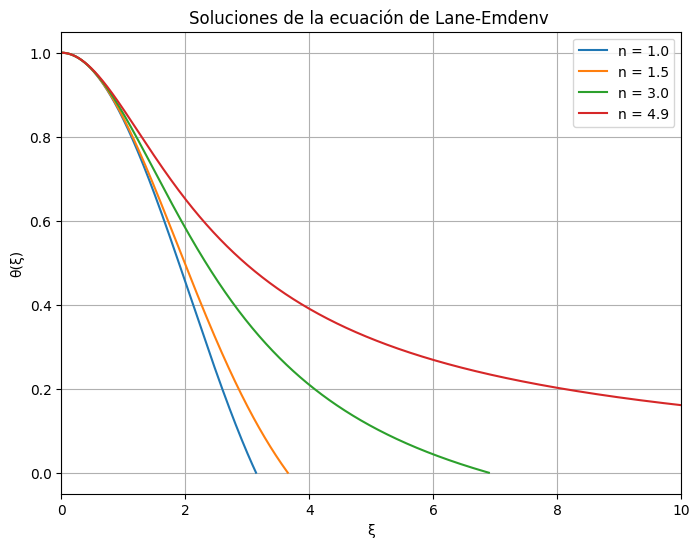

In [13]:
# Condiciones iniciales
ns = [1, 1.5, 3, 4.9]
ns = np.array(ns)
Yo = [1, 0]
xi_max = 400

# Creando listas para guardar los valores importantes
dtheta_dxi_at_xi1 = []
xi1s = []

plt.figure(figsize=(8,6))
for n in ns:
    sol = solve_ivp(lane_emden,
                    [1e-2, xi_max],
                    y0=Yo,
                    args=(n,),
                    events=surface,
                    max_step=0.01)

    # Guardando los valores de ξ_1 y de dθ/dξ
    xi1 = sol.t_events[0][0]
    theta_p = sol.y[1][-1]
    dtheta_dxi_at_xi1.append(theta_p)
    xi1s.append(xi1)

    # Gráfica de theta(xi)
    plt.plot(sol.t, sol.y[0], label=f"n = {n}")
    if sol.t_events[0].size > 0:
        print(f"n={n} → Superficie en ξ_1 ≈ {xi1:.4f}")
    else:
        print(f"n={n} → No se alcanzó θ = 0 en el intervalo dado")

plt.xlabel("ξ")
plt.ylabel("θ(ξ)")
plt.title("Soluciones de la ecuación de Lane-Emdenv ")
plt.xlim(0,10)
plt.legend()
plt.grid()
plt.show()

##b)
Suponga una temperatura central $T_c = 1.5\times 10^7\,\text{K}$, y una composición química de hidrógeno ionizado con peso molecular medio $\mu = 0.61$. Use la ecuación de estado del gas ideal para determinar la densidad central $\rho_c$ compatible con un valor razonable del parámetro politrópico $K$. Puede usar la relación:

$$
K = \frac{k_B T_c}{\mu m_p} \, \rho_c^{-1/n}
$$

donde $k_B$ es la constante de Boltzmann y $m_p$ la masa del protón.


###*Aclaración*
Dado que el enunciado del problema no proporciona suficientes datos físicos (como la masa o el radio del objeto estelar), no es posible calcular directamente el valor del parámetro politrópico $ K $.

Por esta razón, se adoptaron valores aproximados de $ K $ provenientes de modelos politrópicos utilizados en astrofísica. Estos modelos están inspirados en estudios clásicos como:

* El *modelo de Chandrasekhar* para enanas blancas, que considera un gas degenerado relativista y corresponde aproximadamente a $ n = 1.5 $.
* El *modelo de Eddington* para estrellas de secuencia principal como el Sol, que emplea un politropo con $ n = 3 $.
* *Modelos de estrellas masivas convectivas*, que pueden aproximarse a índices politrópicos altos como $ n = 4.9 $.


In [14]:
# Constantes físicas
kB = 1.38e-23        # Constante de Boltzmann (J/K)
m_p = 1.67e-27        # Masa del protón (kg)
G = 6.67e-11          # Constante de gravitación universal (N m^2/kg^2)

# Parámetros del problema
T_c = 1.5e7           # Temperatura central (K)
mu = 0.61             # Peso molecular medio

# Valores aproximados de K (en SI)
Ks = np.array([
    2.0e5,     # n = 1.0 → enanas blancas simplificadas
    1.5e7,     # n = 1.5 → estrellas no relativistas
    3.5e9,     # n = 3.0 → valor calibrado al Sol
    1.0e11     # n = 4.9 → estrellas masivas
])

# Hallando las densidades según su prpametro n y K
rhos = (kB * T_c / (mu * m_p * Ks) )**ns

# Las densidades centrales para cada objeto son
print("Densidades centrales (rho_c) para cada n:")
for n_val, rho_c in zip(ns, rhos):
    print(f"n = {n_val:<4} --> rho_c = {rho_c:.3e} kg/m^3")

Densidades centrales (rho_c) para cada n:
n = 1.0  --> rho_c = 1.016e+06 kg/m^3
n = 1.5  --> rho_c = 1.577e+06 kg/m^3
n = 3.0  --> rho_c = 1.957e+05 kg/m^3
n = 4.9  --> rho_c = 3.227e+01 kg/m^3


##c) Calcule, para cada valor de n, el radio dimensional R del cuerpo mediante:

$$
R = a \, \xi_1, \quad \text{con} \quad a^2 = \frac{(n+1)K}{4\pi G} \, \rho_c^{\frac{1-n}{n}}
$$

In [15]:
# Calcular a para cada n
ases = np.sqrt((Ks*(ns + 1)) / (4 * np.pi * G) * rhos **((1 - ns) / ns))

# Radio dimensional
xi1s = np.array(xi1s)
Rs = ases * xi1s

# Imprimir
print("Radios dimensionales (R) para cada n:")
for n_val, R in zip(ns, Rs):
    print(f"n = {n_val:<4} --> R = {R:.3e} m")

Radios dimensionales (R) para cada n:
n = 1.0  --> R = 6.863e+07 m
n = 1.5  --> R = 7.163e+07 m
n = 3.0  --> R = 4.855e+08 m
n = 4.9  --> R = 1.141e+12 m


##d) Calcule la masa total del cuerpo mediante:

$$
M =4 π \cdot a^3 \cdot \rho_c \left(-\xi^2 \frac{d\theta}{d\xi}\right)_{\xi =\xi_1}
$$

In [16]:
# Calcular masa para cada n
Ms = 4 * np.pi * (ases**3) * rhos * (-xi1s**2 * dtheta_dxi_at_xi1)

# Imprimir
print("Masas aproximadas para cada n:")
for n_val, M in zip(ns, Ms):
    print(f"n = {n_val:<4} --> M = {M:.3e} Kg")

Masas aproximadas para cada n:
n = 1.0  --> M = 4.182e+29 Kg
n = 1.5  --> M = 4.053e+29 Kg
n = 3.0  --> M = 1.731e+30 Kg
n = 4.9  --> M = 2.064e+32 Kg


##e) Grafique, para cada caso, los perfiles de temperatura, densidad y presión en función de la distancia al centro. Analice visualmente las diferencias.

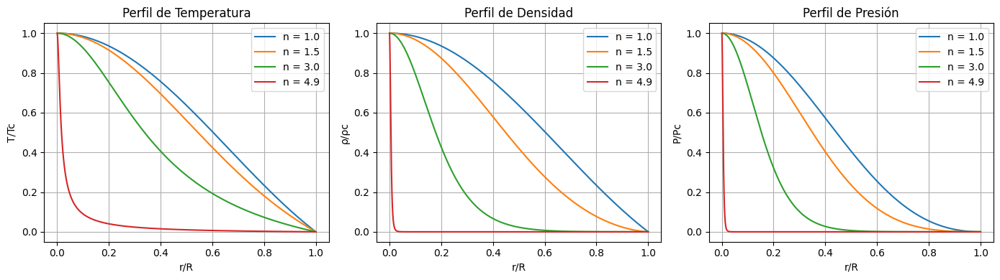

In [17]:
plt.figure(figsize=(14, 4))

for i, n in enumerate(ns):
    # Obtener la solución de Lane-Emden
    sol = solve_ivp(
        lane_emden,
        [1e-2, xi_max],
        y0=Yo,
        args=(n,),
        events=surface,
        max_step=0.01
    )

    xi = sol.t
    theta = sol.y[0]

    # Parámetros físicos para este n
    rho_c = rhos[i]
    T_c_n = T_c
    K_n = Ks[i]
    a = ases[i]
    R = Rs[i]

    # Convertir ξ a radio dimensional
    r = xi * a

    # Perfiles físicos
    rho = rho_c * theta**n
    T = T_c_n * theta
    P = K_n * rho**(1 + 1/n)

    # Recortar donde theta es negativa (por estabilidad)
    mask = theta > 0
    r = r[mask] / R  # normalizado a R
    rho = rho[mask] / rho_c
    T = T[mask] / T_c
    P = P[mask] / P[0]  # normalizamos con P(0)

    # Subgráficas
    plt.subplot(1, 3, 1)
    plt.plot(r, T, label=f"n = {n}")
    plt.xlabel("r/R");
    plt.ylabel("T/Tc");
    plt.title("Perfil de Temperatura")
    plt.grid(True)

    plt.subplot(1, 3, 2)
    plt.plot(r, rho, label=f"n = {n}")
    plt.xlabel("r/R"); plt.ylabel("ρ/ρc"); plt.title("Perfil de Densidad")
    plt.grid(True)

    plt.subplot(1, 3, 3)
    plt.plot(r, P, label=f"n = {n}")
    plt.xlabel("r/R"); plt.ylabel("P/Pc"); plt.title("Perfil de Presión")
    plt.grid(True)

for i in range(1, 4):
    plt.subplot(1, 3, i)
    plt.legend()

plt.tight_layout()
plt.show()

##f) **Clasificación atrofísica** con base en los valores obtenidos para la masa M, el radio R, y el perfil de densidad, determine qué tipo de objeto estelar podría corresponder a cada caso (por ejemplo):
* ¿Se parece a una estrella de secuencia principal como el Sol?
* ¿Representa una enana blanca (masas cercanas a 1 M⊙, radios del orden
de la Tierra)?
* ¿Corresponde a una estrella masiva, con núcleo radiativo?
* ¿Es físicamente razonable un modelo con n = 4.9?
Justifique la clasificación basándose en órdenes de magnitud y tendencias observadas.


### Solución


| Índice $n$  | Masa [kg]                  | Radio [m]                  | Clasificación astrofísica                              |
|------------|----------------------------|-----------------------------|---------------------------------------------------------|
|  1.0        | $4.182 × 10^{29}$     | $6.863 × 10^{7}$       | Enana blanca idealizada                                 |
| 1.5        | $4.053 × 10^{29}$     | $7.163 × 10^{7}$       | Enana blanca no relativista                             |
| 3.0        | $1.731 × 10^{30}$     | $4.855 × 10^{8}$       | Estrella tipo solar (secuencia principal)               |
| 4.9        | $2.064 × 10^{32}$     | $1.141 × 10^{12}$      | Modelo no realista (estrella muy masiva)                |


- **n = 1.0 y 1.5**: Corresponden a modelos de **enanas blancas**, con masas del orden de una masa solar ($\sim 10^{30}$ kg), pero con radios muy pequeños ($\sim 10^7$ m), similares al tamaño de la Tierra. Esto es típico de objetos muy densos y degenerados. Las curvas de densidad muestran que la materia está distribuida de forma más homogénea, con gradientes suaves desde el centro hacia la superficie.

- **n = 3.0**: Representa razonablemente bien al Sol, con una masa cercana a $1.7 \times 10^{30}$ kg (muy próxima a $M_{\odot}$) y un radio de $4.8 \times 10^8$ m. Este modelo politrópico refleja una **estrella de secuencia principal**, donde la densidad disminuye rápidamente desde el centro. Las curvas de densidad y presión en este caso presentan una caída más pronunciada, lo cual es coherente con un núcleo energético y una envoltura menos densa.

- **n = 4.9**: Da lugar a una masa y radio extremadamente grandes ($\sim 100 M_{\odot}$ y $10^{12}$ m), valores que no se observan en estrellas reales.  Además, las curvas de densidad para este caso muestran que la densidad está **muy fuertemente concentrada en el centro** pues más del 90% de la masa está contenida en un volumen muy pequeño . A partir de ahí, la densidad cae casi a cero de inmediato. Esto indica una configuración **altamente inestable y físicamente irrealista**.


En resumen, las soluciones politrópicas muestran cómo el índice $n$ influye en la estructura interna de una estrella: cuanto mayor es $n$, más concentrada está la masa en las regiones internas. Esto se refleja tanto en los perfiles de densidad como en las diferencias de radio y masa.




##g) Explore cómo varía la masa total si cambia la temperatura central Tc entre $5\times 10^6 K$ y  $5\times 10^7K$ Grafique la dependencia *M(Tc)* y comente qué tipo decuerpos podrían formarse con distintas temperaturas centrales.


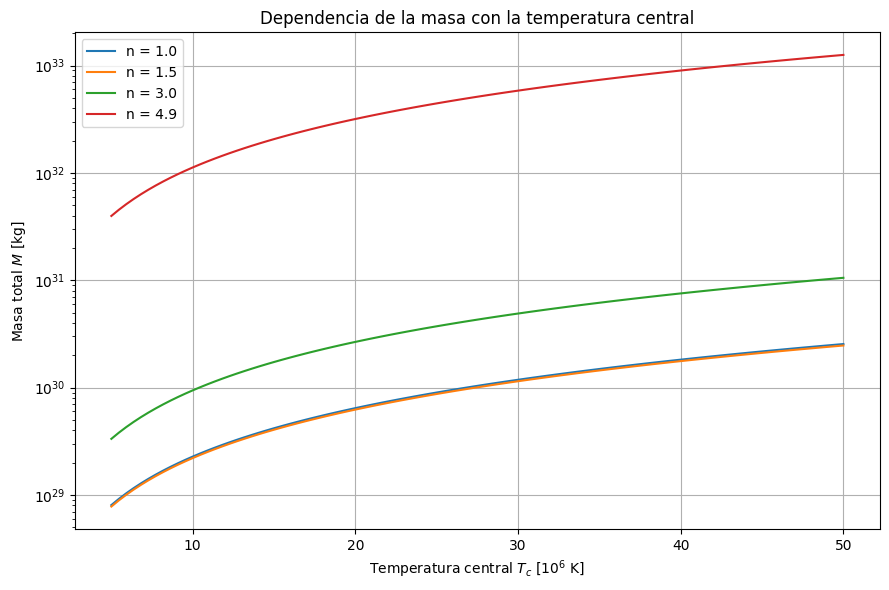

In [18]:
# Rango de temperaturas centrales (en K)
Tcs = np.linspace(5e6, 5e7, 100)

# Inicializamos figura
plt.figure(figsize=(9,6))

# Cálculo de M(T_c) para cada n
for i, n in enumerate(ns):
    rho_c = rhos[i]
    xi1 = xi1s[i]
    dtheta_dxi = dtheta_dxi_at_xi1[i]

    # Masa para cada T_c
    Ms = []

    for Tc in Tcs:
        # Calculamos K para este T_c manteniendo rho_c fija
        K = (kB * Tc) / (mu * m_p) * rho_c**(-1/n)

        # Escala a para este K
        a = np.sqrt((K * (n + 1)) / (4 * np.pi * G) * rho_c**((1 - n)/n))

        # Masa total
        M = 4 * np.pi * a**3 * rho_c * (-xi1**2 * dtheta_dxi)
        Ms.append(M)

    # Graficamos
    plt.plot(Tcs / 1e6, Ms, label=f"n = {n}")

# Decoración del gráfico
plt.xlabel("Temperatura central $T_c$ [$10^6$ K]")
plt.ylabel("Masa total $M$ [kg]")
plt.title("Dependencia de la masa con la temperatura central")
plt.grid(True)
plt.yscale("log") # Mejorar visualización
plt.legend()
plt.tight_layout()
plt.show()


###Análisis
La masa total de un objeto autogravitante modelado mediante un índice politrópico $n$ depende sensiblemente de la temperatura central $T_c$. En el rango considerado de $T_c$ entre $5 \times 10^6\,\mathrm{K}$ y $5 \times 10^7\,\mathrm{K}$, se observan diferentes comportamientos según el valor de $n$, como se muestra en la Figura. Estos reflejan cómo la estructura interna —y en particular la distribución de densidad— influye en la respuesta gravitacional del sistema.



* Para *índices bajos* ($n = 1.0$ y $1.5$):  La masa total permanece prácticamente constante al aumentar $T_c$. Esto es característico de enanas blancas idealizadas, donde la presión de degeneración electrónica domina sobre la presión térmica. En estos objetos, la estructura interna es poco sensible al calor y la densidad se distribuye de forma relativamente uniforme.
    
* En el caso de $n = 3$: Se observa un crecimiento moderado de la masa con la temperatura central. Este valor de $n$ es representativo de estrellas de secuencia principal, como el Sol. En estos casos, la presión térmica juega un papel importante y, por tanto, un aumento en $T_c$ se traduce en una mayor masa y radio estelar.
    
* Para $n = 4.9$: La masa crece rápidamente con la temperatura, alcanzando valores del orden de $10^{32}\,\mathrm{kg}$ o más. Sin embargo, este comportamiento se considera físicamente irrealista: el perfil de densidad calculado muestra que la mayor parte de la masa está fuertemente concentrada cerca del centro, mientras que el resto del volumen estelar presenta densidades prácticamente nulas. Esto implica que el modelo politrópico con $n = 4.9$ no representa una estrella estable completa, sino más bien una idealización del núcleo central extremadamente comprimido.



En resumen, los modelos politrópicos ofrecen una descripción versátil de distintas clases de objetos estelares, pero su aplicabilidad física depende en gran medida del valor de $n$ elegido.



#Referencias
D.D.Clayton,
*Principles of Stellar Evolution and Nucleosynthesis*, University of Chicago Press, 1983.

CJ.Hansen, S.D.Kawaler, and V.Trimble,
*Stellar Interiors: Physical Principles, Structure, and Evolution*,  Springer, 2nd ed., 2004.